In [59]:
import numpy as np
import matplotlib.pyplot as plt 
import glob
import matplotlib as mpl
import matplotlib.image as mpimg
import cv2
%matplotlib inline

In [60]:
#to watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from multiprocessing import Pool
#import dill as pickle
from functools import partial

# Calibration of Camera
Here we are calibrating camera using OpenCV and Python. The images in camera_cal older have been used to perform the Calibration

In [64]:
def getImagepoints(path = 'camera_cal/calibration*.jpg'):
    ##This function help to get image point in 2D image of the picture
    ## and object points in real scenario
    
    objpt = [] #3d points in real world 
    imgpts = [] #2d point in image plane
    chessboard = [] #array of chessboard images in camera_cal
    
    
    object_point = np.zeros((6*9,3), np.float32)
    object_point[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
    
    
    images = glob.glob(path)
    
    for fnames in images:
        nx = 9
        ny = 6
        img = cv2.imread(fnames)
        gray_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        
        ret,corners = cv2.findChessboardCorners(gray_img,(nx,ny),None) #helps to find the corners of chessboard
        
        if ret==True:
            objpt.append(object_point)
            imgpts.append(corners)
            
            
            #Draw the corners and display
            
            cv2.drawChessboardCorners(img,(nx,ny),corners,ret)
            
    return objpt,imgpts



def Calibrate_undistort(img,objectpoint,imagepoint):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objectpoint,imagepoint,gray.shape[::-1],None,None)
    dst = cv2.undistort(img,mtx,dist,None,mtx)
    
    return dst

        
    

Text(0.5,1,'undistorted Image')

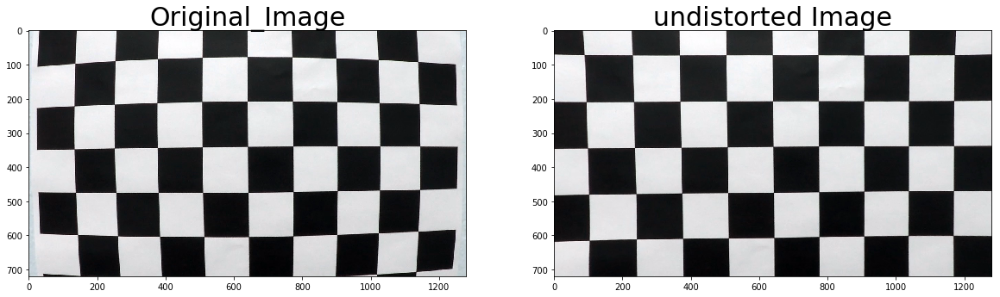

In [72]:
obj_point,img_point = getImagepoints()
test_image = cv2.imread('camera_cal/calibration1.jpg')
undistort_image = Calibrate_undistort(test_image,obj_point,img_point)

#Visualization of Original and Undistorted 
f,(axes_1,axes_2) = plt.subplots(1,2,figsize = (20,10))
axes_1.imshow(test_image)
axes_1.set_title('Original_Image',fontsize=30)
cv2.imwrite('output_images_new/calibration_new.jpg',undistort_image)
axes_2.imshow(undistort_image)
axes_2.set_title('undistorted Image',fontsize =30)

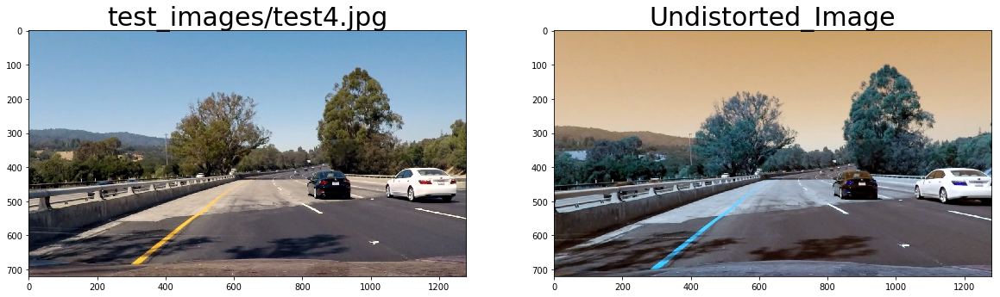

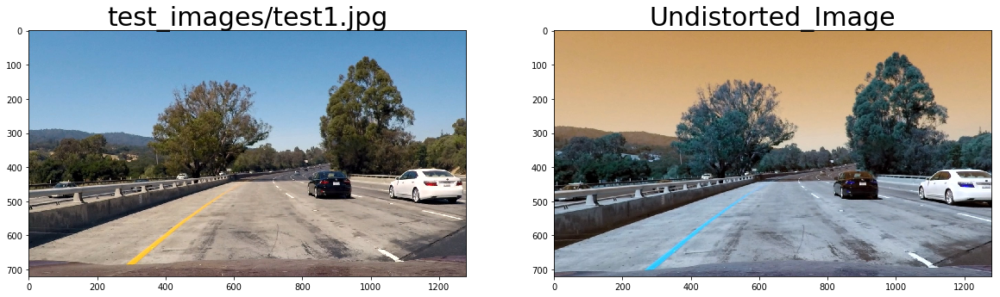

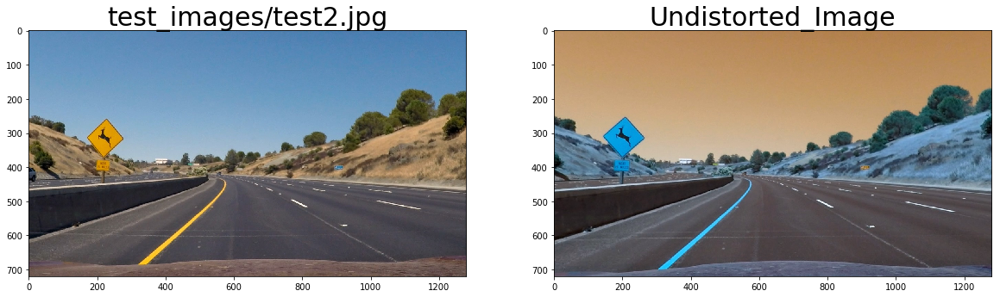

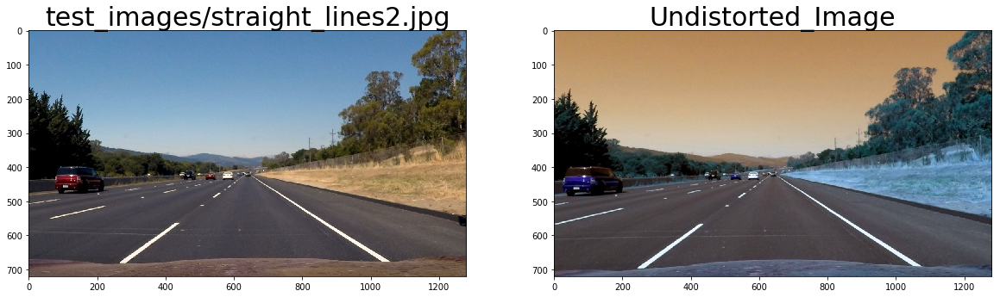

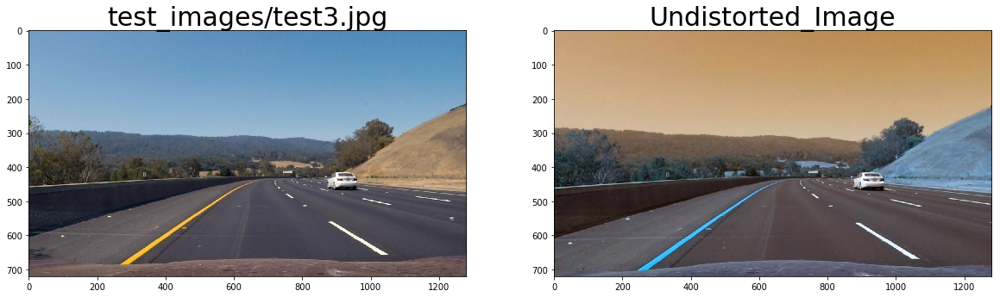

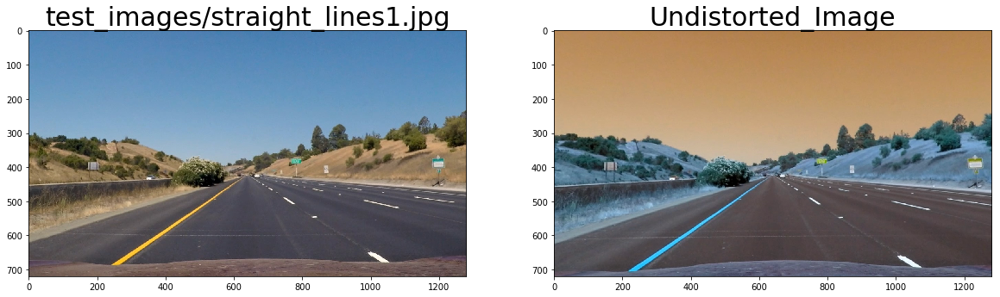

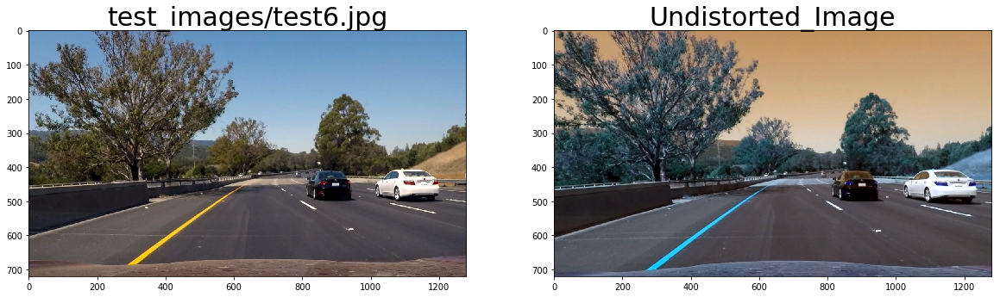

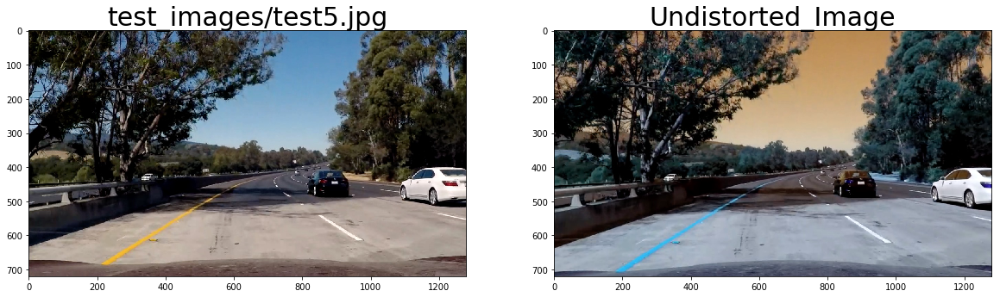

In [73]:
##Test for correct camera calibration ###
images = glob.glob('test_images/*.jpg')

for fnames in images:
    img = cv2.imread(fnames)
    undist_img = Calibrate_undistort(img,obj_point,img_point)
    path = 'output_images_new/undist_img'+fnames[12:]
    cv2.imwrite(path,undist_img)
    f,(ax1,ax2) = plt.subplots(1,2,figsize = (20,10))
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    ax1.set_title(fnames,fontsize=30)
    ax2.imshow(undist_img)
    ax2.set_title('Undistorted_Image',fontsize=30)           

# Conversion to Binary Image 
Three threshold have been taken after numerous iteration of Trail and error

In [74]:
def Combined_Threshold(image,grad_thresh = (20,100),sat_thresh = (150,255),red_thresh = (150,255)):
    #Apply following to image
    
    #1) Convert Image to Grayscale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    
    
    #Sobel x
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0) #applying derivative in x direction
    abs_sobelx = np.absolute(sobelx) # Absolute derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx)) #Scale to 8-bit (0 - 255) then convert to type = np.uint8
    
    
    #Create a mask of 1's where the scaled_gradient magnitude is
    # greater than equal to  grad_thresh or less than equal to grad_thresh
    #Threshold  X gradient 
    sx_binary = np.zeros_like(scaled_sobel)
    sx_binary[(scaled_sobel>=grad_thresh[0]) & (scaled_sobel<=grad_thresh[1])] = 1
    
    
    #Threshold on Saturation channel of HLS of original image 
    
    hls = cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel>=sat_thresh[0]) & (s_channel<=sat_thresh[1])] = 1
    
    
    #Threshold on red channel of original image 
    
    red_channel = image[:,:,0]
    red_binary = np.zeros_like(red_channel)
    red_binary[(red_channel>=red_thresh[0]) & (red_channel<=red_thresh[1])] = 1
    
    #Combining the above binary thresholds
    combined_threshold = np.zeros_like(sx_binary)
    combined_threshold[(s_binary==1) | (sx_binary==1) | (red_binary==1)] = 1
    
    return combined_threshold
    

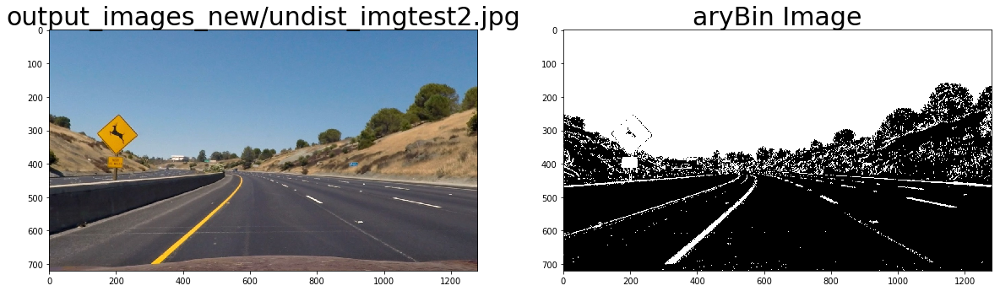

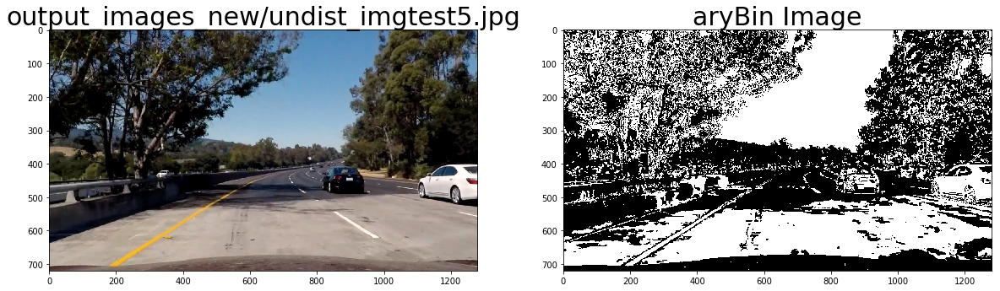

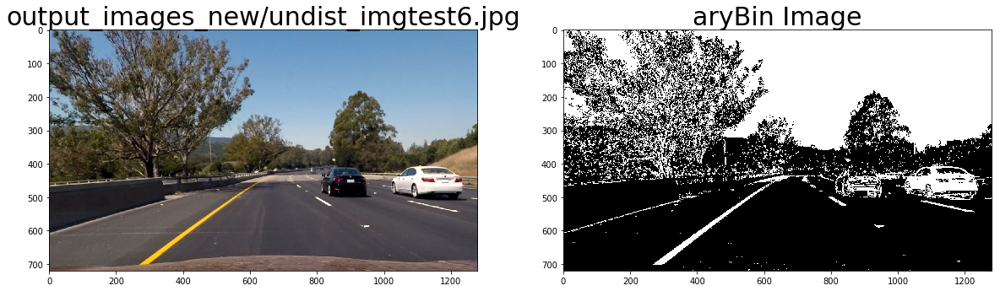

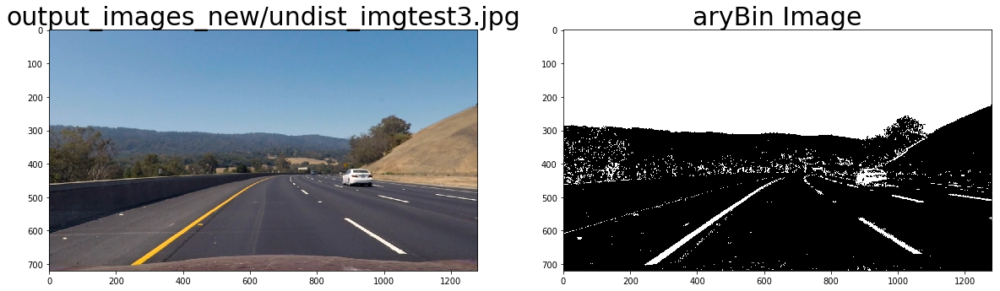

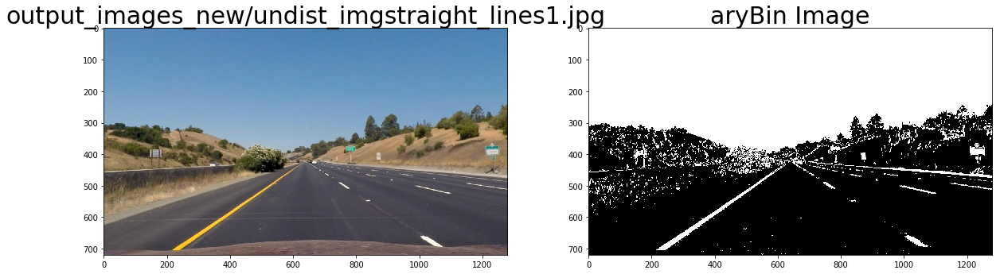

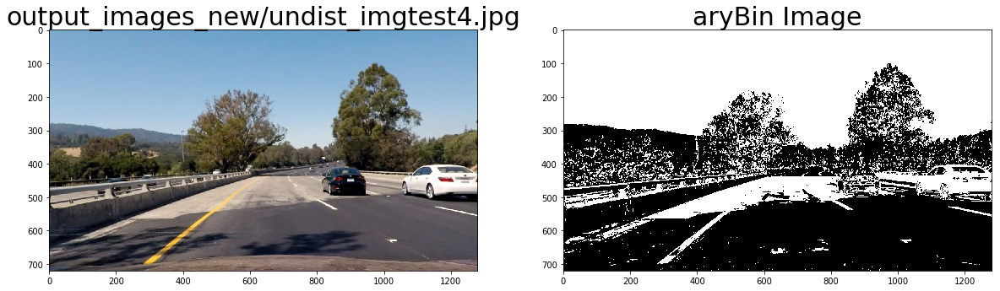

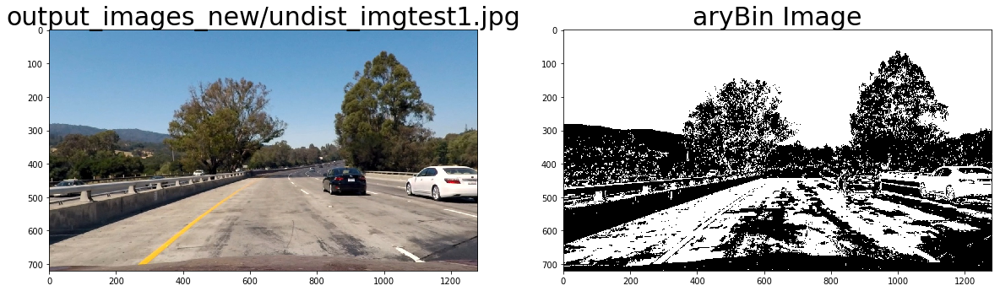

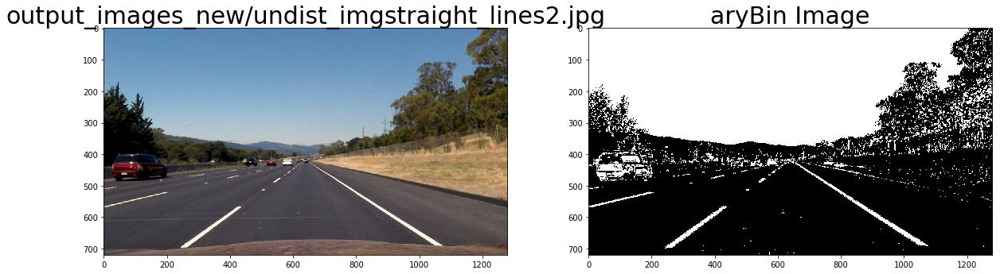

In [75]:
images = glob.glob('output_images_new/undist_img*.jpg')

for fnames in images:
    img = cv2.imread(fnames)
    binary_image = Combined_Threshold(img)
    
    
    #Visualize the Binary Conversions of test images 
    
    f ,(ax1,ax2) = plt.subplots(1,2,figsize = (20,10))
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    ax1.set_title(fnames,fontsize = 30)
    ax2.imshow(binary_image,'gray')
    ax2.set_title('aryBin Image',fontsize=30)

# Color Thresholding 
using gradient,magnitude,direction,and Color Space 

In [76]:
#Sobel

def gradient_threshold(image,orient='x',sobel_kernel=3,thresh=(0, 255)):
    
    img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    
    if orient == 'x':
        sobel = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize = sobel_kernel)
        abs_sobel = np.absolute(sobel)
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    elif orient == 'y':
        sobel = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize= sobel_kernel)
        abs_sobel = np.absolute(sobel)
        scaled_sobel= np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)] = 1
    
    
    return gradient_binary


def magnitude_threshold(image,sobel_kernel = 3, mag_thresh=(0, 255)):
    
    img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize = sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize = sobel_kernel)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    abs_magnitude = np.absolute(abs_sobelxy)
    scaled_sobel = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    
    magnitude_binary = np.zeros_like(scaled_sobel)
    magnitude_binary[(scaled_sobel>=mag_thresh[0]) & (scaled_sobel<=mag_thresh[1])] =1
    
    
    return magnitude_binary


def direction_threshold(image,sobel_kernel=3,thresh=(0, np.pi/2)):
    
    img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize = sobel_kernel)
    
    absolute_sobelx = np.absolute(sobelx)
    absolute_sobely = np.absolute(sobely)
    
    theta = np.arctan2(absolute_sobely,absolute_sobelx)
    
    direction_binary = np.zeros_like(theta)
    direction_binary[(theta>=thresh[0]) & (theta<=thresh[1])] = 1
    
    
    return direction_binary


def combined_threshold(image,show= False):
    
    ksize =3
    
    gradx = gradient_threshold(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = gradient_threshold(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = magnitude_threshold(image, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = direction_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.4))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    
    img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    
    s_channel = hls[:,:,2]
    sthresh_min = 150
    sthresh_max = 255
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel>=sthresh_min) & (s_channel<=sthresh_max)] = 1
    
    combined_binary = np.zeros_like(combined)
    combined_binary[(s_binary==1) | (combined==1)] = 1
    
    
    return combined_binary,combined,s_binary

    
    
    
    

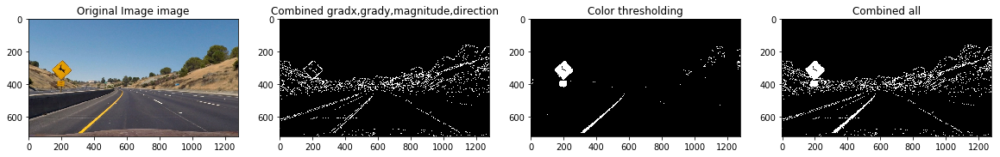

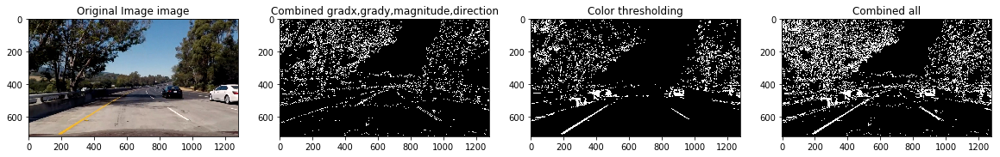

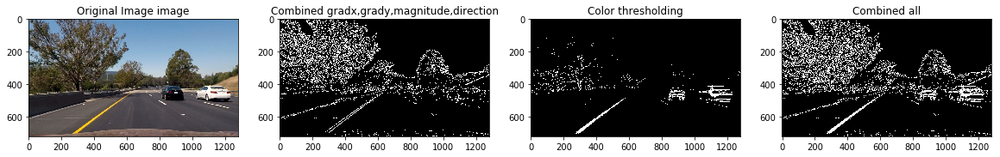

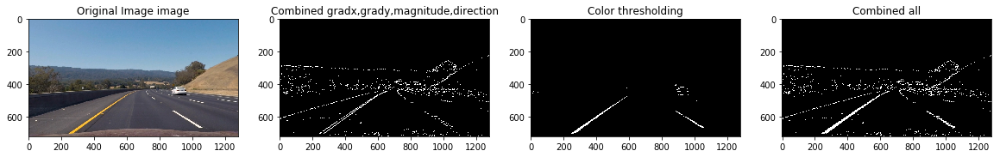

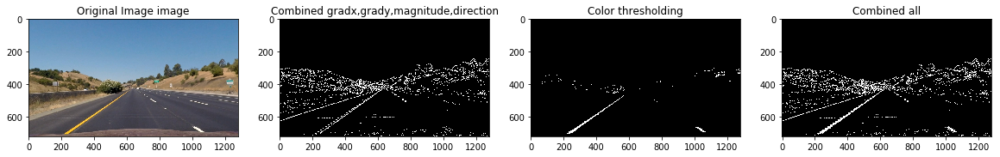

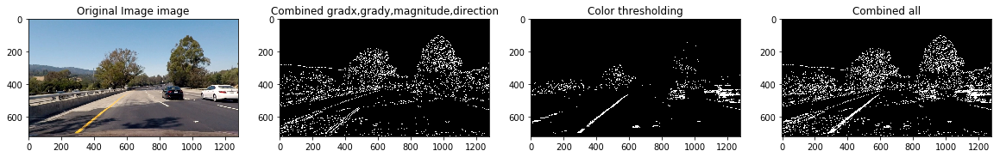

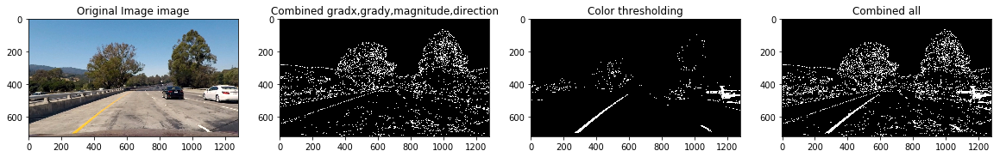

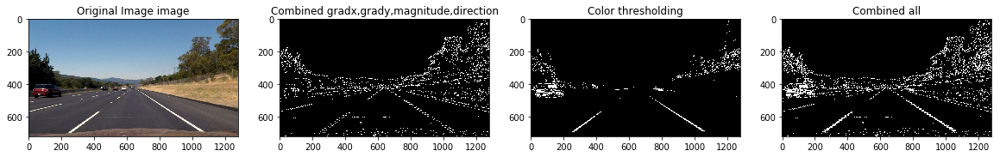

In [77]:
images_new = glob.glob('output_images_new/u*.jpg')

for fname in images_new:
    img = cv2.imread(fname)
    combined_binary,combined,s_binary = combined_threshold(img,show = False)
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
    ax1.set_title('Original Image image')
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    ax2.set_title('Combined gradx,grady,magnitude,direction')
    ax2.imshow(combined, cmap='gray')
    ax3.set_title('Color thresholding')
    ax3.imshow(s_binary, cmap='gray')
    ax4.set_title('Combined all')
    ax4.imshow(combined_binary, cmap='gray')
    
    
    
    

# Perspective Transform

In [78]:
def getsrcdestpoiny():
    
    #Source Point
    bottom_left = [220,720]
    bottom_right = [1110, 720]
    top_left = [570, 470]
    top_right = [722, 470]
    
    src = np.float32([bottom_left,bottom_right,top_right,top_left])
    
    pts = np.float32([bottom_left,bottom_right,top_right,top_left])
    
    pts = pts.reshape((-1,1,2))
    
    
    #Destination point
    bottom_left = [320,720]
    bottom_right = [920,720]
    top_left = [320,1]
    top_right = [920,1]
    dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    
    return pts,src,dst 

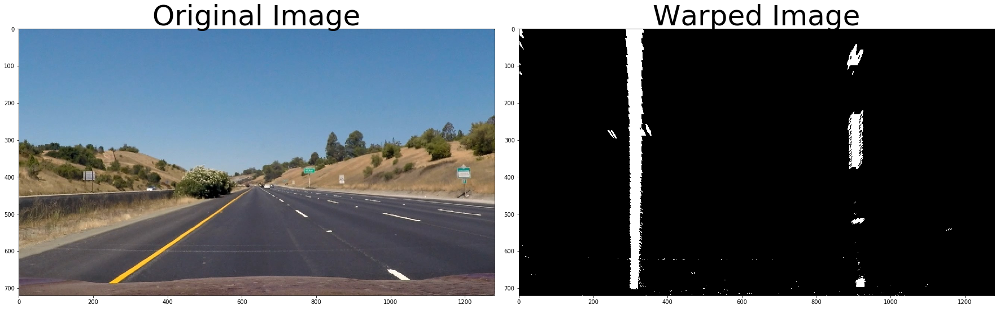

In [94]:
# image = cv2.imread('output_images_new/undist_imgstraight_lines1.jpg')

image = cv2.imread('test_images/straight_lines1.jpg')
pts,src,dst = getsrcdestpoiny()
M = cv2.getPerspectiveTransform(src,dst)
M_inv = cv2.getPerspectiveTransform(dst,src)
warped = cv2.warpPerspective(Combined_Threshold(image),M,(image.shape[1],image.shape[0]),flags = cv2.INTER_LINEAR)

copy = image.copy()
#cv2.polylines(copy,[pts],True,(0,0,255), thickness=5)

#Plotting the result 
f,(ax1,ax2) = plt.subplots(1,2,figsize =(24,9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(copy,cv2.COLOR_RGB2BGR))
cv2.imwrite('output_images_new/polygon_img.jpg',copy)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)







# HISTOGRAM

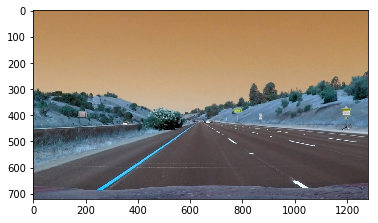

In [95]:
plt.imshow(image)

In [96]:
def histogram_f(image):
    #Consider bottom half of the image 
    bottom_half = image[int(image.shape[0]//2):,:]
    
    #sum up all the values of bottom half images along columns
    
    hist = np.sum(bottom_half,axis =0)
    return hist

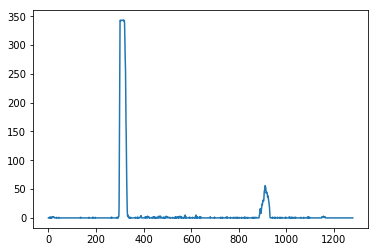

In [97]:
histogram = histogram_f(warped)
plt.plot(histogram)

In [98]:
#Finding Lane peaks in histogram


def lane_peaks(histogram):
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    
    return leftx_base,rightx_base

In [99]:
print("base_index : ", lane_peaks(histogram))

base_index :  (302, 911)


In [100]:
warped.shape

(720, 1280)

In [101]:
#Lane Finding Function which is to be used in pipeline later

def find_lane_pixels(warped):
    histogram = histogram_f(warped)
    leftx_base,rightx_base = lane_peaks(histogram)
    
    output_image = np.dstack((warped,warped,warped)) * 255
    
    
    #Hyperparameters
    #1)Choose the number of sliding window
    nwindow = 10
    margin =100
    minpix = 50
    num_rows = warped.shape[0]
    
    height = np.int(warped.shape[0]//nwindow)
    
    #Identify the non-zero x and y pixel value
    nonzero = warped.nonzero()
    nonzero_x = np.array(nonzero[1])
    nonzero_y = np.array(nonzero[0])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    
    
    
    #Create empty list to store the indices of left and right pixels
    left_lane_ids = []
    right_lane_ids =[]
    
    for window in range(nwindow):
        win_y_low = warped.shape[0]-(window+1)*height
        win_y_high = warped.shape[0] - window*height
        
        
        #calculate for left lane
        
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        
        cv2.rectangle(output_image,(win_xleft_low,win_y_low),
                     (win_xleft_high,win_y_high),(0,255,0),2)
        
        good_left_inds = ((nonzero_x>=win_xleft_low) & (nonzero_x<win_xleft_high) &
                         (nonzero_y>=win_y_low) & (nonzero_y<win_y_high)).nonzero()[0]
        
        
        if(len(good_left_inds) > minpix):
            leftx_current = np.int(np.mean(nonzero_x[good_left_inds]))
        
        #calculate for right lane similarly as above
        
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        cv2.rectangle(output_image,(win_xright_low,win_y_low),
                     (win_xright_high,win_y_high),(0,255,0),2)
        
        good_right_inds = ((nonzero_x>=win_xright_low) & (nonzero_x<win_xright_high) &
                          (nonzero_y>=win_y_low) & (nonzero_y<win_y_high)).nonzero()[0]
        
        
        if(len(good_right_inds)>minpix):
            rightx_current = np.int(np.mean(nonzero_x[good_right_inds]))
            
        left_lane_ids.append(good_left_inds)
        right_lane_ids.append(good_right_inds)
        
    try:
        left_lane_ids= np.concatenate(left_lane_ids)
        right_lane_ids = np.concatenate(right_lane_ids)
    except ValueError:
        pass
    
    output_image[nonzero_y[left_lane_ids],nonzero_x[left_lane_ids]] = [255,0,0]
    output_image[nonzero_y[right_lane_ids],nonzero_x[right_lane_ids]] = [0,255,0]
    
    return fit_polynomial(nonzero_x,nonzero_y,left_lane_ids,right_lane_ids,num_rows)

def fit_polynomial(nonzero_x,nonzero_y,left_lane_ids,right_lane_ids,num_rows):
    left_x = nonzero_x[left_lane_ids]
    left_y = nonzero_y[left_lane_ids]
    
    if ( left_x.size ==0 | left_y.size==0):
        return None , None
    
    polyfit_left = np.polyfit(left_y,left_x,2)
    
    right_x = nonzero_x[right_lane_ids]
    right_y = nonzero_y[right_lane_ids]
    
    
    if(right_x.size==0 | right_y.size==0):
        return None,None
    polyfit_right = np.polyfit(right_y,right_x,2)
    
    #Generate x and y values for plotting
    
    ploty = np.linspace(0,num_rows-1,num_rows)
    
    left_fitx = polyfit_left[0]*ploty**2 + polyfit_left[1] * ploty + polyfit_left[2]
    right_fitx = polyfit_right[0]*ploty**2 + polyfit_right[1]*ploty + polyfit_right[2]
    
    return left_fitx,right_fitx
    
        
        
        
    

(720, 0)

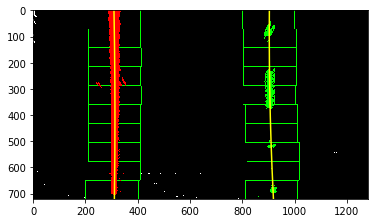

In [104]:
##for testing purpose
leftx_base,rightx_base = lane_peaks(histogram_f(warped))
output_image = np.dstack((warped,warped,warped)) * 255
    
    
#Hyperparameters
#1)Choose the number of sliding window
nwindow = 10
margin =100
minpix = 50
num_rows = warped.shape[0]
    
height = np.int(warped.shape[0]//nwindow)
    
#Identify the non-zero x and y pixel value
nonzero = warped.nonzero()
nonzero_x = np.array(nonzero[1])
nonzero_y = np.array(nonzero[0])
    
# Current positions to be updated later for each window in nwindows
leftx_current = leftx_base
rightx_current = rightx_base
    
    
    
    
#Create empty list to store the indices of left and right pixels
left_lane_ids = []
right_lane_ids =[]
    
for window in range(nwindow):
    win_y_low = warped.shape[0]-(window+1)*height
    win_y_high = warped.shape[0] - window*height
        
        
    #calculate for left lane
        
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
        
    cv2.rectangle(output_image,(win_xleft_low,win_y_low),
                (win_xleft_high,win_y_high),(0,255,0),2)
        
    good_left_inds = ((nonzero_x>=win_xleft_low) & (nonzero_x<=win_xleft_high) &
                    (nonzero_y>=win_y_low) & (nonzero_y<=win_y_high)).nonzero()[0]
        
        
    if(len(good_left_inds) > minpix):
        leftx_current = np.int(np.mean(nonzero_x[good_left_inds]))
        
    #calculate for right lane similarly as above
        
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
        
    cv2.rectangle(output_image,(win_xright_low,win_y_low),
                (win_xright_high,win_y_high),(0,255,0),2)
        
    good_right_inds = ((nonzero_x>=win_xright_low) & (nonzero_x<=win_xright_high) &
                    (nonzero_y>=win_y_low) & (nonzero_y<=win_y_high)).nonzero()[0]
        
        
    if(len(good_right_inds)>minpix):
        rightx_current = np.int(np.mean(nonzero_x[good_right_inds]))
            
    left_lane_ids.append(good_left_inds)
    right_lane_ids.append(good_right_inds)
        
try:
    left_lane_ids= np.concatenate(left_lane_ids)
    right_lane_ids = np.concatenate(right_lane_ids)
except ValueError:
    pass
    
output_image[nonzero_y[left_lane_ids],nonzero_x[left_lane_ids]] = [255,0,0]
output_image[nonzero_y[right_lane_ids],nonzero_x[right_lane_ids]] = [0,255,0]
    
    
left_x = nonzero_x[left_lane_ids]
left_y = nonzero_y[left_lane_ids]
    
    
polyfit_left = np.polyfit(left_y,left_x,2)
    
right_x = nonzero_x[right_lane_ids]
right_y = nonzero_y[right_lane_ids]
    
polyfit_right = np.polyfit(right_y,right_x,2)
    
#Generate x and y values for plotting
    
ploty = np.linspace(0,num_rows-1,num_rows)
    
left_fitx = polyfit_left[0]*ploty**2 + polyfit_left[1] * ploty + polyfit_left[2]
right_fitx = polyfit_right[0]*ploty**2 + polyfit_right[1]*ploty + polyfit_right[2]
    
plt.imshow(output_image,'gray')
plt.plot(left_fitx,ploty,color='yellow')
plt.plot(right_fitx,ploty,color='yellow')
plt.xlim(0,warped.shape[1])
plt.ylim(warped.shape[0],0)

# Finding Radius of Curvature

In [119]:
def measure_roc_real(x_values):
    xm_per_pixel = 3.7/700
    ym_per_pixel = 30/720
    
    
    ploty = np.linspace(0,num_rows-1,num_rows)
    y_eval = np.max(ploty)
    
    fit_cr = np.polyfit(ploty*ym_per_pixel , x_values*xm_per_pixel,2)
    curvature = ((1+(2*fit_cr[0]*y_eval*ym_per_pixel + fit_cr[1]) ** 2)**(1.5)) / np.absolute(2*fit_cr[0])
    return curvature


def roc_offset(left_fitx,right_fitx):
    #calculation of left and right curvature 
    left_roc= measure_roc_real(left_fitx)
    right_roc = measure_roc_real(right_fitx)
    average_roc = (left_roc+right_roc) / 2
    
    lane_center = (right_fitx[719] + left_fitx[719])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    
    return average_roc,center_offset_mtrs

In [120]:
num_rows = warped.shape[0]
img_size = image.shape
average_radius , center_offset = roc_offset(left_fitx,right_fitx)
print("Radius of Curvature: %.2f m "  %average_radius)
print("Center offset: %.2f" %center_offset)


Radius of Curvature: 5695.12 m 
Center offset: 1.35


# Final Pipeline Modelling

In [135]:

def get_averaged_line(prev_lines, new_line):
    
    #Number of previous frames to be considered for average
    num_frames = 10
    
    if new_line is None:
        if len(prev_lines) == 0:
            return prev_lines, None
        else:
            return prev_lines, prev_lines[-1]
    else:
        if len(prev_lines) < num_frames:
            
            prev_lines.append(new_line)
            return prev_lines, new_line
        else:
            
            prev_lines[0:num_frames-1] = prev_lines[1:]
            prev_lines[num_frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for i in range(num_frames):
                new_line += prev_lines[i]
            new_line = new_line/num_frames
            return prev_lines, new_line
        
        
def get_mean_distance(left_line, right_line, curr_avg):
    
    mean_dist = np.mean(right_line - left_line)
    if curr_avg == 0:
        curr_avg = mean_dist
    else:
        curr_avg = 0.9*curr_avg + 0.1*mean_dist
    return curr_avg
    


In [136]:

# define global variables
polyfit_left=None
polyfit_right=None

past_good_left_lines = []
past_good_right_lines = []

curr_mean_diff = 0

def pipeline(img):
    global polyfit_right
    global polyfit_left
    global past_good_right_lines
    global past_good_left_lines
    global curr_mean_diff
    
    #undistort frame
    img = Calibrate_undistort(img,obj_point,img_point)
    
    # get thresholded image
    thresholded = Combined_Threshold(img)
    
    # perform a perspective transform
    warped = cv2.warpPerspective(thresholded, M, (image_shape[1], image_shape[0]) , flags=cv2.INTER_LINEAR)
    
    #output image to show the resultant identified lines
    out_img = np.dstack((warped, warped, warped))*255
    
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped.shape[0]
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    #flag indicates that you have to find lane lines from scratch(without any prior information)
    
    if (polyfit_left is None) or (polyfit_right is None):
        # If the polynomial coefficients of the previous frames are None then find lane line from scratch
        flag = True
        left_x_predictions, right_x_predictions = find_lane_pixels(warped)
    else:
        # Else search in a margin of 100 pixels on each side of the pervious polynomial fit
        flag = False
        margin = 100
        left_x_predictions = polyfit_left[0]*non_zeros_y**2 + polyfit_left[1]*non_zeros_y + polyfit_left[2]
        left_lane_inds = ((non_zeros_x >= left_x_predictions - margin) & (non_zeros_x <= left_x_predictions + margin)).nonzero()[0]

        right_x_predictions = polyfit_right[0]*non_zeros_y**2 + polyfit_right[1]*non_zeros_y + polyfit_right[2]
        right_lane_inds = ((non_zeros_x >= right_x_predictions - margin) & (non_zeros_x <= right_x_predictions + margin)).nonzero()[0]
        
        left_x_predictions, right_x_predictions = fit_polynomial(non_zeros_x, non_zeros_y, left_lane_inds, right_lane_inds, num_rows)
    
    if (left_x_predictions is None or right_x_predictions is None):
        if not flag:
            left_x_predictions, right_x_predictions = find_lane_pixels(warped)
            
   
    outlier = False
            
    if (left_x_predictions is None or right_x_predictions is None):
        outlier = True
    else:
        mean_diff = np.mean(right_x_predictions - left_x_predictions)
        
        if curr_mean_diff == 0:
            curr_mean_diff = mean_diff
        #The threshold values are taken after trial and error
        if (mean_diff < 0.7*curr_mean_diff or mean_diff > 1.3*curr_mean_diff):
            outlier = True
            if not flag:
                left_x_predictions, right_x_predictions = find_lane_pixels(warped)
                if (left_x_predictions is None or right_x_predictions is None):
                    outlier = True
                else:
                    mean_diff = np.mean(right_x_predictions - left_x_predictions)
                    if (mean_diff < 0.7*curr_mean_diff or mean_diff > 1.3*curr_mean_diff):
                        outlier = True
                    else:
                        outlier = False
        else:
            outlier = False
            
    if outlier:
        polyfit_left = None
        polyfit_right = None
        if len(past_good_left_lines) == 0 and len(past_good_right_lines) == 0:
            return img
        else:
            left_x_predictions = past_good_left_lines[-1]
            right_x_predictions = past_good_right_lines[-1]
    else:
        past_good_left_lines, left_x_predictions = get_averaged_line(past_good_left_lines, left_x_predictions)
        past_good_right_lines, right_x_predictions = get_averaged_line(past_good_right_lines, right_x_predictions)
        mean_diff = np.mean(right_x_predictions - left_x_predictions)
        curr_mean_diff = 0.9*curr_mean_diff + 0.1*mean_diff
    
    left_line_window = np.array(np.transpose(np.vstack([left_x_predictions, y_points])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_x_predictions, y_points]))))
    
    #get radius of curvature and offset from center
    avg_rad,center_offset_mtrs = roc_offset(left_x_predictions,right_x_predictions)
    
    #Fill green
    poly_points = np.vstack([left_line_window, right_line_window])    
    cv2.fillPoly(out_img, np.int_([poly_points]), [0,255, 0])    
    unwarped = cv2.warpPerspective(out_img, M_inv, (image_shape[1], image_shape[0]) , flags=cv2.INTER_LINEAR)
    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    
    #Print data on video
    radius_str = "Radius of curvature: %.2f m" % avg_rad
    offset_str = "Center offset: %.2f m" % center_offset_mtrs
    cv2.putText(result,radius_str , (80, 80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)
    cv2.putText(result, offset_str, (80, 110), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)
    
    return result
        
        
        
    

# Testing the Pipeline

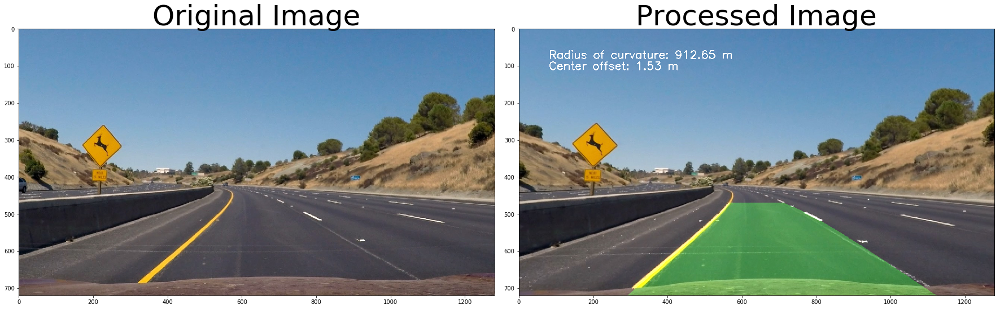

In [137]:
img = mpimg.imread('test_images/test2.jpg')
image_shape = img.shape
# Reinitialize some global variables.
polyfit_left = None
polyfit_right = None
past_good_right_lines = []
past_good_left_lines = []
curr_mean_diff = 0

# Apply pipeline
processed = pipeline(img)
cv2.imwrite('output_images_new//pipeline_output.jpg',cv2.cvtColor(processed,cv2.COLOR_RGB2BGR))

# Plot the 2 images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(processed, cmap='gray')
ax2.set_title('Processed Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Video

In [138]:
# Reinitialize some global variables.
polyfit_left = None
polyfit_right = None
past_good_right_lines = []
past_good_left_lines = []
curr_mean_diff = 0


output = 'project_video_output_new.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output_new.mp4
[MoviePy] Writing video project_video_output_new.mp4



 99%|█████████▉| 125/126 [01:11<00:00,  1.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_new.mp4 

CPU times: user 1min, sys: 251 ms, total: 1min 1s
Wall time: 1min 14s
